# Content-Based Image Retrieval (CBIR sys.) & GANs
## Deep Learning Approaches for Image Search & Image Generation
### by: Faezeh Azhir
date: 03-02-2025

In [5]:
import os
import cv2
import numpy as np
import PIL
import PIL.Image
import time
import tensorflow as tf
from matplotlib import pyplot as plt
import pathlib
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Rescaling, LeakyReLU, BatchNormalization, Conv2D, Conv2DTranspose, Flatten, Reshape, ReLU, Dropout, UpSampling2D, Dense

This code processes a dataset of images stored in a directory structure where each subdirectory represents a class (e.g., types of flowers). It iterates through each class directory, reads the image files, resizes them to 224x224 pixels, and stores them in a list. Each image is also assigned a numeric label corresponding to its class, based on the directory it is in.

Once all images are processed, they are converted into a NumPy array for efficient computation, with their pixel values normalized to the range [0, 1]. The labels are also converted into a NumPy array, representing the class of each image as an integer.

The final output consists of:

1- A 4D NumPy array (images) containing the normalized image data, with a shape like (number of images, 224, 224, 3) <br>
2- A 1D NumPy array (labels) with the corresponding class labels for these images. <br>
This processed data can be used as input for training a machine learning or deep learning model for tasks such as image classification.

### Define dataset path and resize dimensions


In [6]:
dataset_path = "flowers"
img_size = (224, 224)

# Load and preprocess images
images = []
labels = []
classes = os.listdir(dataset_path)

for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(dataset_path, class_name) 
    # Check if it's a directory
    if os.path.isdir(class_path):
        for img_name in os.listdir(class_path):
            img_path = os.path.join(class_path, img_name)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.resize(img, img_size)
                images.append(img)
                labels.append(class_idx)


images = np.array(images, dtype='float32') / 255.0  # Normalize
labels = np.array(labels)


# PART 1: 
# Content-Based Image Retrieval (CBIR)
### we will test and compare the Precision of three different Model in this part:

- ### ResNet50 Model
- ### Vgg16 Model
- ### InceptionV3 Model


# ResNet50 Model

This code uses a pre-trained ResNet50 model to extract meaningful features from the provided images without performing classification. These features represent high-level patterns in the images, such as textures or shapes, which are useful for tasks like clustering or further machine learning. The extracted features are saved in a file (features.pkl) using the pickle library, so they can be reused later without re-processing the images.

In [7]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
import time

start_time = time.time()

# Load pre-trained ResNet50
base_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Extract features
features = base_model.predict(images)

# Save feature embeddings
import pickle
with open('features.pkl', 'wb') as f:
    pickle.dump(features, f)



end_time = time.time()
elapsed_time_resnet50 = end_time - start_time
print(f"Execution time: {elapsed_time_resnet50:.5f} seconds")


115/115 ━━━━━━━━━━━━━━━━━━━━ 236s 2s/step
Execution time: 249.69726 seconds


below code finds and displays the most visually similar images to a query image from a dataset using a pre-trained ResNet50 model and cosine similarity. Here's what it does:

### Feature Extraction for the Query Image:
The query image is loaded, resized, and normalized to match the preprocessing applied to the dataset. Its features are then extracted using the ResNet50 model, which generates a compact, high-dimensional feature vector representing the image's key characteristics.

### Cosine Similarity Calculation:
The cosine similarity is computed between the query image's features and the features of all images in the dataset. Cosine similarity measures how close the feature vectors are in terms of their direction, with higher values indicating greater similarity.

### Finding the Most Similar Images:
The dataset images are ranked based on their similarity to the query image. The indices of the top 21 most similar images are retrieved, with the highest similarity at the top.


## choose a sample flower image from your dataset to use as query image

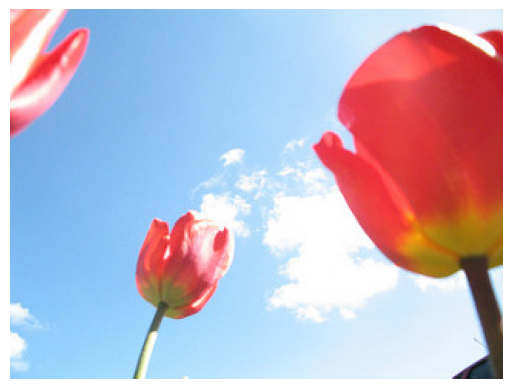

In [8]:
import matplotlib.pyplot as plt  # This is required to use plt.show()
import matplotlib.image as mpimg

# Load the image
image_path = 'tulips.jpg'  # Replace with the correct path to your image
img = mpimg.imread(image_path)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide the axes
plt.show()


In [9]:
from sklearn.metrics.pairwise import cosine_similarity

# Load query image and extract features
query_img = cv2.imread('tulips.jpg')
query_img = cv2.resize(query_img, img_size) / 255.0
query_feature = base_model.predict(np.expand_dims(query_img, axis=0))

# Compute similarity scores
similarities = cosine_similarity(query_feature, features)

# Get top-N similar images
top_n = 5
top_indices = similarities[0].argsort()[-top_n:][::-1]
print("Top similar images:", top_indices)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 466ms/step
Top similar images: [2929 1812  258 2023 3342]



### Visualizing the Results:
A 4x5 grid of images is created to display the query image alongside its closest matches. The query image is shown in the first position, and the remaining grid displays the most similar images from the dataset, each labeled with its match rank and corresponding class folder name.

### Interactive Visualization:
The results are shown using Matplotlib, with a clear layout and no axes for better visualization. This provides an intuitive way to compare the query image with its top matches.

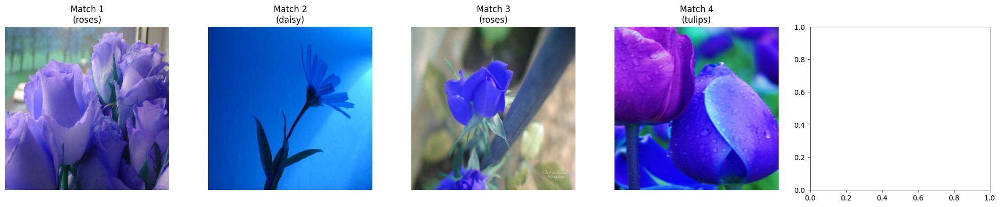

In [11]:
# Ensure indices are within range
valid_top_indices = [idx for idx in top_indices if idx < len(images)]

# Adjust the grid size dynamically for displaying images
num_rows = (top_n // 5) + (1 if top_n % 5 != 0 else 0)  # Adjust rows based on top_n
num_cols = min(top_n, 5)  # Max 5 columns

# Create a dynamic grid based on top_n
fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 4, num_rows * 4))

# Ensure axes is always treated as an iterable, even if there's only one row
if num_rows == 1:
    axes = np.expand_dims(axes, axis=0)

# Display retrieved similar images, excluding the query image itself
for i, idx in enumerate(valid_top_indices[1:]):  # Start from the second match
    row = i // num_cols  # Determine row
    col = i % num_cols  # Determine column
    axes[row, col].imshow(images[idx])
    folder_name = classes[labels[idx]]
    axes[row, col].set_title(f"Match {i + 1}\n({folder_name})")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


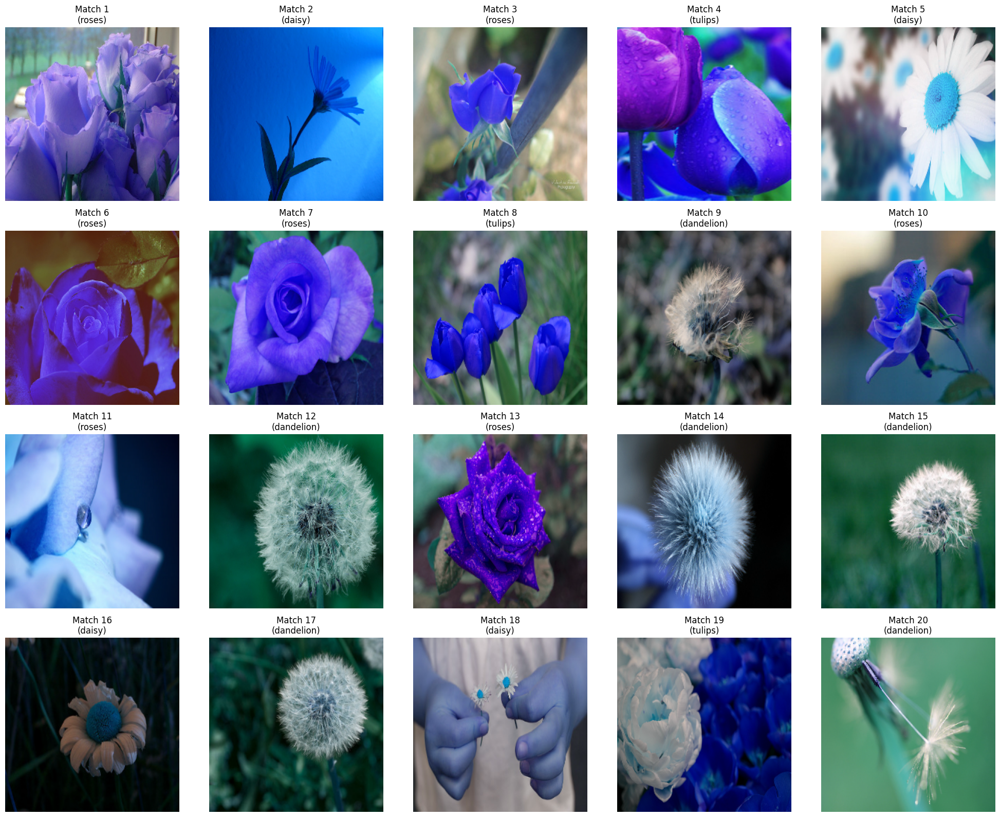

In [19]:
import matplotlib.pyplot as plt

# Create a 4x5 grid for plotting (4 rows, 5 columns)
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

# Display query image
axes[0, 0].imshow(query_img)
axes[0, 0].set_title("Query Image")
axes[0, 0].axis('off')  # Hide the axes for the query image

# Display similar images, excluding the query image itself
for i, idx in enumerate(top_indices[1:top_n + 1]):  # Start from the second match
    row = (i // 5)  # Determine the row (0 to 3)
    col = i % 5  # Determine the column (0 to 4)
    axes[row, col].imshow(images[idx])
    folder_name = classes[labels[idx]]
    axes[row, col].set_title(f"Match {i + 1}\n({folder_name})")
    axes[row, col].axis('off')  # Hide axes for each image

# Adjust layout
plt.tight_layout()
plt.show()


In [20]:
# Query image's class
query_class = labels[top_indices[0]]  # Class of the query image

# Count matches from the correct class, excluding the query image itself
relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices[1:])  # Exclude first match
total_retrieved = len(top_indices) - 1  # Exclude query itself
total_relevant = sum(labels == query_class) - 1  # Exclude query itself from relevant count

# Calculate Precision and Recall
precision_resnet50 = relevant_retrieved / total_retrieved
recall_resnet50 = relevant_retrieved / total_relevant

print(f"precision_resnet50: {precision_resnet50:.2f}")
print(f"recall_resnet50: {recall_resnet50:.5f}")



precision_resnet50: 0.15
recall_resnet50: 0.00376


In [22]:
# Query image's class
query_class = labels[top_indices[0]]  # Class of the query image

# Count matches from the correct class, excluding the query image itself
relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices[1:])  # Exclude first match
total_retrieved = len(top_indices) - 1  # Exclude query itself
total_relevant = sum(labels == query_class) - 1  # Exclude query itself from relevant count
total_images = len(labels)  # Total number of images in the dataset

# Calculate Precision and Recall
precision_resnet50 = relevant_retrieved / total_retrieved if total_retrieved > 0 else 0
recall_resnet50 = relevant_retrieved / total_relevant if total_relevant > 0 else 0

# Calculate Accuracy
accuracy_resnet50 = relevant_retrieved / total_images if total_images > 0 else 0  # Accuracy formula

# Print Results
print(f"with ntop=5,Precision ResNet50: {precision_resnet50:.2f}")
print(f"Recall ResNet50: {recall_resnet50:.5f}")
print(f"Accuracy ResNet50: {accuracy_resnet50:.5f}")


with ntop=5,Precision ResNet50: 0.15
Recall ResNet50: 0.00376
Accuracy ResNet50: 0.00082


In [15]:
f1_score_resnet50 = 2 * (precision_resnet50 * recall_resnet50) / (precision_resnet50 + recall_resnet50)
print(f"f1_score_resnet50 : {f1_score_resnet50:.5f}")

f1_score_resnet50 : 0.00249


In [16]:
from sklearn.metrics.pairwise import cosine_similarity

# Load query image and extract features
query_img = cv2.imread('tulips.jpg')
query_img = cv2.resize(query_img, img_size) / 255.0
query_feature = base_model.predict(np.expand_dims(query_img, axis=0))

# Compute similarity scores
similarities = cosine_similarity(query_feature, features)

# Get top-N similar images
top_n = 21
top_indices = similarities[0].argsort()[-top_n:][::-1]
print("Top similar images:", top_indices)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 185ms/step
Top similar images: [2929 1812  258 2023 3342  172 2018 1889 3384  657 1637 1585 1493 2080
 1052 1003  412 1228  166 3533 1349]


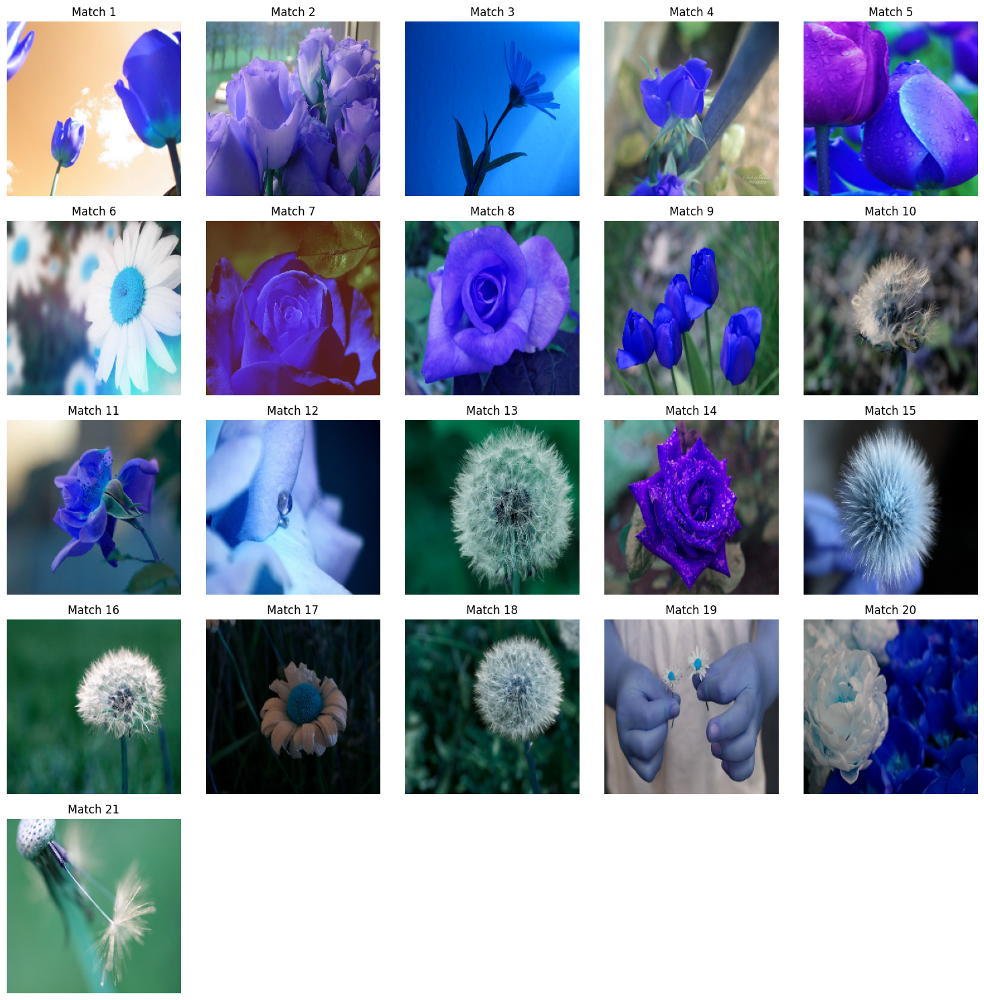

In [17]:
#chatgpt
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
for i, idx in enumerate(top_indices):
    img = images[idx]  
    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Match {i + 1}")

plt.tight_layout()
plt.show()



In [23]:
# Query image's class
query_class = labels[top_indices[0]]  # Class of the query image

# Count matches from the correct class, excluding the query image itself
relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices[1:])  # Exclude first match
total_retrieved = len(top_indices) - 1  # Exclude query itself
total_relevant = sum(labels == query_class) - 1  # Exclude query itself from relevant count
total_images = len(labels)  # Total number of images in the dataset

# Calculate Precision and Recall
precision_resnet50 = relevant_retrieved / total_retrieved if total_retrieved > 0 else 0
recall_resnet50 = relevant_retrieved / total_relevant if total_relevant > 0 else 0

# Calculate Accuracy
accuracy_resnet50 = relevant_retrieved / total_images if total_images > 0 else 0  # Accuracy formula

# Print Results
print(f"with ntop=21,Precision ResNet50: {precision_resnet50:.2f}")
print(f"Recall ResNet50: {recall_resnet50:.5f}")
print(f"Accuracy ResNet50: {accuracy_resnet50:.5f}")


with ntop=21,Precision ResNet50: 0.15
Recall ResNet50: 0.00376
Accuracy ResNet50: 0.00082


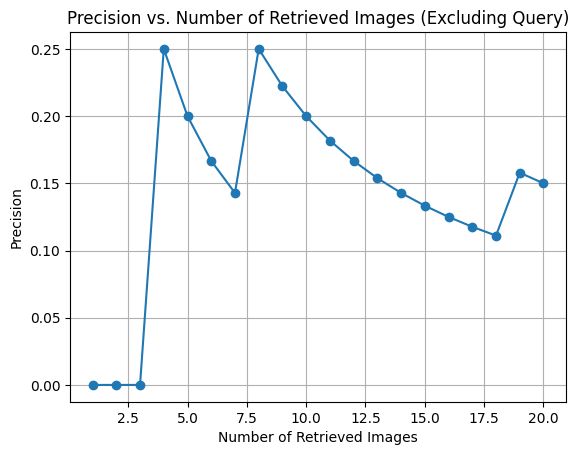

In [24]:
precision_resnet = []
for k in range(1, len(top_indices)):
    relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices[1:k+1])  # Start from second match
    precision_resnet.append(relevant_retrieved / k)

plt.plot(range(1, len(top_indices)), precision_resnet, marker='o')
plt.title("Precision vs. Number of Retrieved Images (Excluding Query)")
plt.xlabel("Number of Retrieved Images")
plt.ylabel("Precision")
plt.grid()
plt.show()


# VGG16 MODEL

In [28]:

from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
import time

start_time = time.time()

# Load pre-trained VGG16 model
base_model2 = VGG16(weights='imagenet', include_top=False, pooling='avg')

# Extract features from images using VGG16
features2 = base_model2.predict(images)

# Save feature embeddings
import pickle
with open('vgg_features.pkl', 'wb') as f:
    pickle.dump(features2, f)




end_time = time.time()
elapsed_time_vgg16 = end_time - start_time
print(f"Execution time for vgg16 model: {elapsed_time_vgg16:.5f} seconds")


115/115 ━━━━━━━━━━━━━━━━━━━━ 570s 5s/step
Execution time for vgg16 model: 593.74829 seconds


In [29]:

from sklearn.metrics.pairwise import cosine_similarity

# Load query image and extract features
query_img = cv2.imread('tulips.jpg')
query_img = cv2.resize(query_img, img_size) / 255.0
query_feature = base_model2.predict(np.expand_dims(query_img, axis=0))

# Compute similarity scores
similarities2 = cosine_similarity(query_feature, features2)

# Get top-N similar images
top_n = 21
top_indices2 = similarities2[0].argsort()[-top_n:][::-1]
print("Top similar images:", top_indices)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
Top similar images: [2929 1812  258 2023 3342  172 2018 1889 3384  657 1637 1585 1493 2080
 1052 1003  412 1228  166 3533 1349]


In [30]:
# Ensure indices are within range
valid_top_indices = [idx for idx in top_indices if idx < len(images)]

for i, idx in enumerate(valid_top_indices[1:top_n + 1]):  
    row = (i // 5)
    col = i % 5
    axes[row, col].imshow(images[idx])
    folder_name = classes[labels[idx]]
    axes[row, col].set_title(f"Match {i + 1}\n({folder_name})")
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


<Figure size 640x480 with 0 Axes>

In [31]:
# Query image's class
query_class = labels[top_indices2[0]]  # Class of the query image

# Count matches from the correct class, excluding the query image itself
relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices2[1:])  # Exclude first match
total_retrieved = len(top_indices2) - 1  # Exclude query itself
total_relevant = sum(labels == query_class) - 1  # Exclude query itself from relevant count
total_images = len(labels)  # Total number of images in the dataset

# Calculate Precision and Recall
precision_vgg16 = relevant_retrieved / total_retrieved if total_retrieved > 0 else 0
recall_vgg16 = relevant_retrieved / total_relevant if total_relevant > 0 else 0

# Calculate Accuracy
accuracy_vgg16 = relevant_retrieved / total_images if total_images > 0 else 0  # Accuracy formula

# Print Results
print(f"Precision VGG16: {precision_vgg16:.2f}")
print(f"Recall VGG16: {recall_vgg16:.5f}")
print(f"Accuracy VGG16: {accuracy_vgg16:.5f}")


Precision VGG16: 0.85
Recall VGG16: 0.02130
Accuracy VGG16: 0.00463


In [32]:
f1_score_vgg16 = 2 * (precision_vgg16 * recall_vgg16) / (precision_vgg16 + recall_vgg16)
print(f"F1 Score_vgg16: {f1_score_vgg16:.5f}")


F1 Score_vgg16: 0.04156


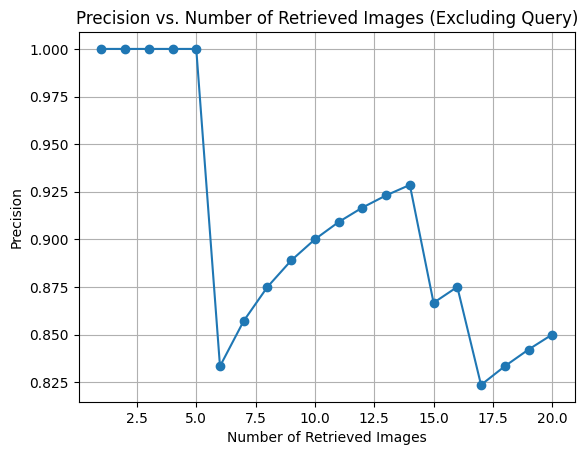

In [33]:
precision_vgg  = []
for k in range(1, len(top_indices2)):
    relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices2[1:k+1])  # Start from second match
    precision_vgg.append(relevant_retrieved / k)

plt.plot(range(1, len(top_indices2)), precision_vgg, marker='o')
plt.title("Precision vs. Number of Retrieved Images (Excluding Query)")
plt.xlabel("Number of Retrieved Images")
plt.ylabel("Precision")
plt.grid()
plt.show()


# InceptionV3

In [34]:

from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
import time

start_time = time.time()


# Load pre-trained InceptionV3 model without the top layer (classification layer)
base_model3 = InceptionV3(weights='imagenet', include_top=False, pooling='avg')

# Extract features from images using InceptionV3
features3 = base_model3.predict(images)

# Save feature embeddings
import pickle
with open('inception_features.pkl', 'wb') as f:
    pickle.dump(features3, f)



end_time = time.time()
elapsed_time_inceptionV3 = end_time - start_time
print(f"Execution time inceptionV3 : {elapsed_time_inceptionV3:.5f} seconds")



115/115 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step    
Execution time inceptionV3 : 152.31425 seconds


In [35]:
from sklearn.metrics.pairwise import cosine_similarity

# Load query image and extract features using InceptionV3
query_img = cv2.imread('tulips.jpg')


query_img = cv2.resize(query_img, img_size) / 255.0
query_feature = base_model3.predict(np.expand_dims(query_img, axis=0))

# Compute similarity scores using cosine similarity
similarities3 = cosine_similarity(query_feature, features3)

# Get top-N similar images
top_n = 21
top_indices3 = similarities3[0].argsort()[-top_n:][::-1]
print("Top similar images:", top_indices)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
Top similar images: [2929 1812  258 2023 3342  172 2018 1889 3384  657 1637 1585 1493 2080
 1052 1003  412 1228  166 3533 1349]


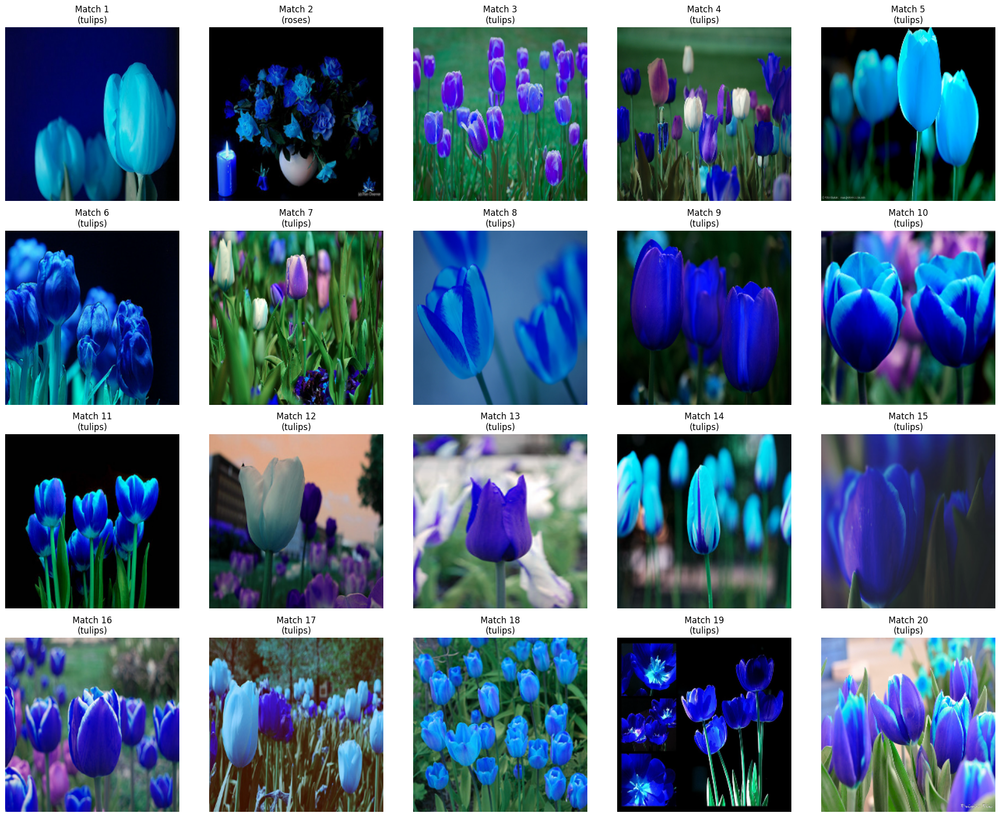

In [36]:
import matplotlib.pyplot as plt

# Create a 4x5 grid for plotting (4 rows, 5 columns)
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

# Display query image
axes[0, 0].imshow(query_img)
axes[0, 0].set_title("Query Image")
axes[0, 0].axis('off')  # Hide the axes for the query image

# Display similar images, excluding the query image itself
for i, idx in enumerate(top_indices3[1:top_n + 1]):  # Start from the second match
    row = (i // 5)  # Determine the row (0 to 3)
    col = i % 5  # Determine the column (0 to 4)
    axes[row, col].imshow(images[idx])
    folder_name = classes[labels[idx]]
    axes[row, col].set_title(f"Match {i + 1}\n({folder_name})")
    axes[row, col].axis('off')  # Hide axes for each image

# Adjust layout
plt.tight_layout()
plt.show()

In [37]:
# Query image's class
query_class = labels[top_indices3[0]]  # Class of the query image

# Count matches from the correct class, excluding the query image itself
relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices3[1:])  # Exclude first match
total_retrieved = len(top_indices3) - 1  # Exclude query itself
total_relevant = sum(labels == query_class) - 1  # Exclude query itself from relevant count
total_images = len(labels)  # Total number of images in the dataset

# Calculate Precision and Recall
precision_inceptionV3 = relevant_retrieved / total_retrieved if total_retrieved > 0 else 0
recall_inceptionV3 = relevant_retrieved / total_relevant if total_relevant > 0 else 0

# Calculate Accuracy
accuracy_inceptionV3 = relevant_retrieved / total_images if total_images > 0 else 0  # Accuracy formula

# Print Results
print(f"Precision InceptionV3: {precision_inceptionV3:.2f}")
print(f"Recall InceptionV3: {recall_inceptionV3:.2f}")
print(f"Accuracy InceptionV3: {accuracy_inceptionV3:.5f}")


Precision InceptionV3: 0.95
Recall InceptionV3: 0.02
Accuracy InceptionV3: 0.00518


In [38]:
f1_score_inceptionV3 = 2 * (precision_inceptionV3 * recall_inceptionV3) / (precision_inceptionV3 + recall_inceptionV3)
print(f"F1 Score inceptionV3: {f1_score_inceptionV3:.2f}")


F1 Score inceptionV3: 0.05


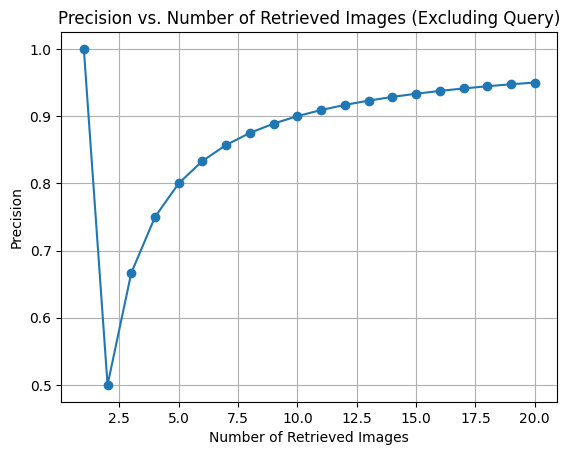

In [39]:
precision_inception  = []
for k in range(1, len(top_indices3)):
    relevant_retrieved = sum(labels[idx] == query_class for idx in top_indices3[1:k+1])  # Start from second match
    precision_inception.append(relevant_retrieved / k)

plt.plot(range(1, len(top_indices3)), precision_inception, marker='o')
plt.title("Precision vs. Number of Retrieved Images (Excluding Query)")
plt.xlabel("Number of Retrieved Images")
plt.ylabel("Precision")
plt.grid()
plt.show()


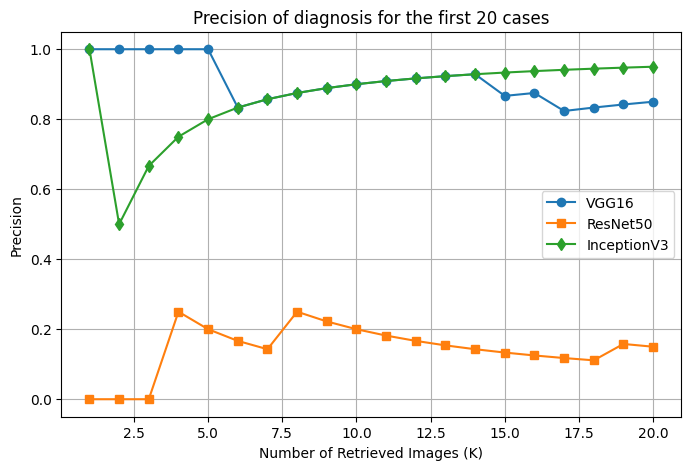

In [40]:
k_values = [x for x in range(1, 21)]


plt.figure(figsize=(8, 5))
plt.plot(k_values, precision_vgg, marker='o', linestyle='-', label="VGG16")
plt.plot(k_values, precision_resnet, marker='s', linestyle='-', label="ResNet50")
plt.plot(k_values, precision_inception, marker='d', linestyle='-', label="InceptionV3")

plt.xlabel("Number of Retrieved Images (K)")
plt.ylabel("Precision")
plt.title("Precision of diagnosis for the first 20 cases")
plt.legend()
plt.grid()
plt.show()


## The Speed of Models
lets see the the elapsed_time execution of each Model.<br>
as we see from the plot , InceptionV3 model is very fast.

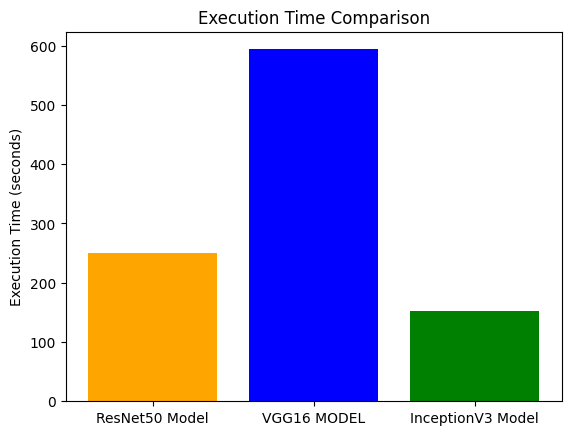

In [41]:
import matplotlib.pyplot as plt

codes = ['ResNet50 Model', 'VGG16 MODEL', 'InceptionV3 Model']
execution_times = [elapsed_time_resnet50, elapsed_time_vgg16, elapsed_time_inceptionV3]  # Replace with your actual execution times

plt.bar(codes, execution_times, color=['orange', 'blue', 'green'])
plt.ylabel('Execution Time (seconds)')
plt.title('Execution Time Comparison')
plt.show()


# Comparison of Models

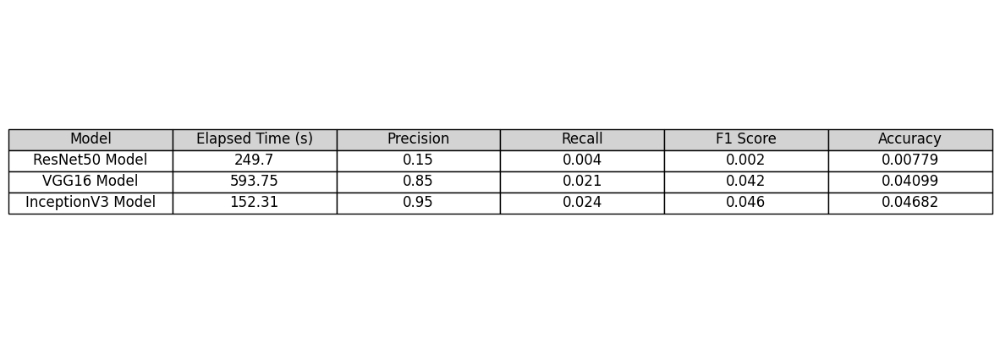

In [42]:
import matplotlib.pyplot as plt
import pandas as pd

# Define model performance metrics
data = {
    "Model": ['ResNet50 Model', 'VGG16 Model', 'InceptionV3 Model'],
    "Elapsed Time (s)": [round(elapsed_time_resnet50, 2), round(elapsed_time_vgg16, 2), round(elapsed_time_inceptionV3, 2)],  # Rounded to 2 decimals
    "Precision": [precision_resnet50, precision_vgg16, precision_inceptionV3],
    "Recall": [round(recall_resnet50, 3), round(recall_vgg16, 3), round(recall_inceptionV3, 3)],  # Rounded to 3 decimals
    "F1 Score": [round(f1_score_resnet50, 3), round(f1_score_vgg16, 3), round(f1_score_inceptionV3, 3)],  # Rounded to 3 decimals
    "Accuracy": [0.00779, 0.04099, 0.04682]  # Adding accuracy values
}

# Convert data to a DataFrame
df = pd.DataFrame(data)

# Create figure and axis with larger size
fig, ax = plt.subplots(figsize=(10, 5))  # Increase width and height
ax.axis("tight")
ax.axis("off")

# Create the table with adjusted font size
table = ax.table(cellText=df.values, colLabels=df.columns, cellLoc="center", loc="center", colColours=["lightgray"]*len(df.columns))

# Adjust table font size
table.auto_set_font_size(False)
table.set_fontsize(12)  # Increase font size
table.scale(1.5, 1.5)  # Scale table size

# Show the table
plt.show()


# Conclusion

## **InceptionV3** Model is not only VERY FAST but also very accurate in identifying the type of the query Image.

# PART 2:
# Generative Adversarial Network (GAN)

GAN is short form of Generative Adversarial Network and a deep learning architecture.<br>
GAN consists of 2 parts:

- Generator
- Discriminator
  
**Generator:** tries to creat fake images and fool the Discriminator. <br>
**Discriminator:** tries to distinguish the images and label them as fake(0) or real(1).

This zero-sum game continuees until the Generator can no longer creat images which fools the Discriminator and the Discriminator cannot be fooled.<br>

There are different types of GAN Models but we are using DCGAN which is the short form of Deep Convolutional GAN.

In [29]:
# tensorflow and keras
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, BatchNormalization
from tensorflow.keras.layers import Conv2D, MaxPool2D, AvgPool2D, Dropout, Reshape, Conv2DTranspose
from tensorflow.keras.models import Sequential
import pathlib
import matplotlib.pyplot as plt
import numpy as np
# from keras.metrics.probabilistic_metrics import BinaryCrossentropy
from tensorflow.keras.losses import BinaryCrossentropy

from tensorflow.keras.optimizers import Adam
import os
import PIL
import time
from IPython import display

### Preparing data and showing some images

In [30]:
root_path = "flowers2"
root_path = pathlib.Path(root_path)

In [32]:
# prepraing data
batch_size = 32

data = keras.utils.image_dataset_from_directory(
    directory=root_path,
    label_mode=None,
    batch_size=batch_size,
    image_size=(64,64))

Found 3668 files.


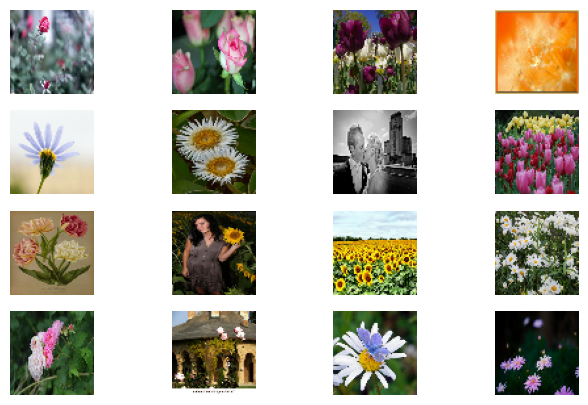

In [33]:
# let's see some images of the dataset
plt.figure(figsize=(8,5))
for images in data.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i+1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.axis("off")

In [34]:
# normalizing the input image to the range [-1, 1]
data = data.map(lambda d : ((d-127.5)/127.5))
data

<_MapDataset element_spec=TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)>

## Building Discriminator
What is Discriminator ?

The Discriminator is a Neural Network model which tries to distinguish the real images from fake images(generated by Generator) and label them as fake(0) or real(1).

Notes :

1.The image size is (64,64), so the input_shape of first conv2d layer should be (64,64,3).

2.The output of Discriminator is either a 0(fake) or 1(real).

3.Using "same" as padding ensures us that the output dimension is not going to change.

4.In the Discriminator function, all activations should be "LeakyReLU", exept the last layer which should be "sigmoid"

5.The last layer is using "sigmoid" as activation function to create a binary output, which real images are labeled as 1 and the fake ones are labeled as 0.

The Discriminator downsamples the input shape.
First let's build Discriminator function

In [35]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, BatchNormalization, Dropout, Flatten, Dense, LeakyReLU, Input

def Discriminator():
    discriminator = Sequential()
    discriminator.add(Input(shape=(64, 64, 3)))  # Define the input shape here
    discriminator.add(Conv2D(filters=64, kernel_size=3, strides=(2, 2), padding="same"))
    discriminator.add(LeakyReLU(negative_slope=0.2))  # Use negative_slope instead of alpha
    discriminator.add(BatchNormalization())
    discriminator.add(Dropout(0.2))

    discriminator.add(Conv2D(filters=128, kernel_size=3, strides=(2, 2), padding="same"))
    discriminator.add(LeakyReLU(negative_slope=0.2))
    discriminator.add(BatchNormalization())
    discriminator.add(Dropout(0.2))

    discriminator.add(Conv2D(filters=256, kernel_size=3, strides=(2, 2), padding="same"))
    discriminator.add(LeakyReLU(negative_slope=0.2))
    discriminator.add(BatchNormalization())
    discriminator.add(Dropout(0.2))

    discriminator.add(Flatten())
    discriminator.add(Dropout(0.2))
    discriminator.add(Dense(units=1, activation="sigmoid"))

    return discriminator

D_model = Discriminator()
D_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_94 (Conv2D)                   │ (None, 32, 32, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_94               │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_95 (Conv2D)                   │ (None, 16, 16, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_95               │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_96 (Conv2D)                   │ (None, 8, 8, 256)           │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_96               │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │          16,385 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 388,993 (1.48 MB)

 Trainable params: 388,097 (1.48 MB)

 Non-trainable params: 896 (3.50 KB)

In [36]:
# optimizer
D_optm = Adam(1e-4)

## Building Generator¶
What is Generator ?

The Generator tries to creat fake images and fool the Discriminator, and Discriminator tries to distinguish the images and label them as fake(0) or real(1).

Notes :

1.The latent space is an arbitrarily defined vector space of Gaussian-distributed values and here I consider 100 as latent_dim.

2.Also units in Dense layer can be (4,4,256) (so it has 4096 nodes)---> 256 versions of 4*4 images.

3.Using "same" as padding ensures us that the output dimension is not going to change.

4.The output shape will be (None, 64, 64, 3) just like the input image(real image) of Discriminator.

In Generator, we can use Upsampling or Conv2DTranspose layer to upsample the input.

In [37]:
latent_dim = 100


In [43]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, BatchNormalization, Conv2DTranspose, ReLU, Input

# Define the latent dimension
latent_dim = 100  # Replace with your desired latent dimension

# Build the Generator function
def Generator():
    generator = Sequential()
    generator.add(Input(shape=(latent_dim,)))  # Define the input shape here
    generator.add(Dense(units=4*4*256, use_bias=False))
    generator.add(Reshape((4, 4, 256)))
    generator.add(BatchNormalization())

    generator.add(Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding="same"))
    generator.add(ReLU())  # Use the ReLU class explicitly
    generator.add(BatchNormalization())

    generator.add(Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding="same"))
    generator.add(ReLU())
    generator.add(BatchNormalization())

    generator.add(Conv2DTranspose(filters=128, kernel_size=(3, 3), strides=(2, 2), padding="same"))
    generator.add(ReLU())
    generator.add(BatchNormalization())

    generator.add(Conv2DTranspose(filters=3, kernel_size=(3, 3), strides=(2, 2), padding="same", activation="tanh"))

    return generator

# A summary of the Generator
G_model = Generator()
G_model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 4096)                │         409,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_94               │ (None, 4, 4, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 128)           │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_95               │ (None, 8, 8, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_96               │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_97               │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           3,459 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,005,827 (3.84 MB)

 Trainable params: 1,004,547 (3.83 MB)

 Non-trainable params: 1,280 (5.00 KB)

In [39]:
# optimizer
G_optm = Adam(1e-4)

Checking if G and D works <br>
Let's see how each model work before training.

In [40]:
# creating random noise
random_noise = tf.random.normal([1,latent_dim])

In [41]:
# feeding random noise to Genereator
G_output_on_random_noise = G_model(random_noise, training=False)

(np.float64(-0.5), np.float64(63.5), np.float64(63.5), np.float64(-0.5))

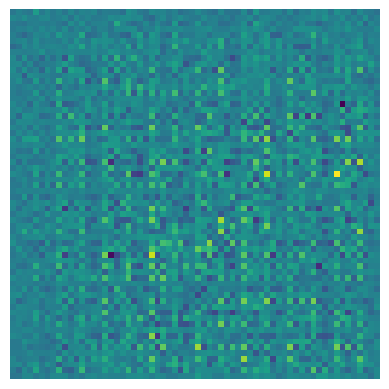

In [42]:
# showing the image output of G_model
plt.imshow(G_output_on_random_noise[0, :, :, 0])
plt.axis("off")

In [43]:
# feeding the output of Generator to Discriminator
D_output_on_random_noise = D_model(G_output_on_random_noise)
print(D_output_on_random_noise)

tf.Tensor([[0.49976847]], shape=(1, 1), dtype=float32)


## Training loop
The training function in DCGAN (Deep Convolutional Generative Adversarial Network) is responsible for training the generator and discriminator networks simultaneously. The goal of this training process is to optimize the generator and discriminator models so that the generator can generate realistic images, while the discriminator can accurately distinguish between real and generated images.

The training process in DCGAN involves two main steps:

- **Training the Discriminator**:

The discriminator network is trained first using a batch of real images from the dataset and a batch of generated images from the generator.
The discriminator assigns probabilities to each image, indicating whether it believes the image is real or generated.
The loss function for the discriminator is calculated based on how well it classifies real and generated images. The goal is to minimize this loss function.
The gradients of the loss function with respect to the discriminator's parameters are computed using backpropagation, and then used to update the discriminator's weights. <br>
<br>
- **Training the Generator**:

After updating the discriminator, we train the generator network.
The generator takes random noise as input and generates fake images.
These generated images are then fed into the updated discriminator.
The loss function for the generator is calculated based on how well it fools the discriminator into classifying its generated images as real.
Similar to before, gradients of this loss function with respect to generator's parameters are computed using backpropagation, and then used to update its weights.

In [44]:
# The code of this cell is from keras sample.
class GAN(tf.keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        seed = tf.random.normal(shape=(batch_size, self.latent_dim))
        # Decode them to fake images
        generated_images = self.generator(seed)
        # Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)
        # Assemble labels discriminating real from fake images
        labels = tf.concat([tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0)
        # Add random noise to the labels - important trick!
        labels += 0.05 * tf.random.uniform(tf.shape(labels))
        # Train the discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights))

        # Sample random points in the latent space
        seed = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Assemble labels that say "all real images"
        misleading_labels = tf.zeros((batch_size, 1))

        # Train the generator (note that we should *not* update the weights of the discriminator)!
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(seed))
            g_loss = self.loss_fn(misleading_labels, predictions)
        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)
        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [45]:
# loss function
loss_fn = tf.keras.losses.BinaryCrossentropy()

In [46]:
# Defining GAN model
model = GAN(discriminator=D_model, generator=G_model, latent_dim=latent_dim)

In [47]:
# Compiling GAN Model
model.compile(d_optimizer=D_optm, g_optimizer=G_optm, loss_fn=loss_fn)

In [44]:
# number of epochs
epochs = 1000
# Fitting the GAN model
history = model.fit(data, epochs=epochs)

Epoch 1/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 42s 310ms/step - d_loss: 0.3989 - g_loss: 1.2520
Epoch 2/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 307ms/step - d_loss: -0.1076 - g_loss: 20.3541   
Epoch 3/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 36s 309ms/step - d_loss: -0.5183 - g_loss: 74.2200
Epoch 4/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 307ms/step - d_loss: -3.4729 - g_loss: 401.5896
Epoch 5/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 306ms/step - d_loss: 4.8655 - g_loss: 541.1883   
Epoch 6/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 307ms/step - d_loss: 0.3501 - g_loss: 87.4156
Epoch 7/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 36s 311ms/step - d_loss: -1.5077 - g_loss: 180.0573
Epoch 8/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 36s 310ms/step - d_loss: 0.4476 - g_loss: 103.5182
Epoch 9/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 307ms/step - d_loss: 0.2975 - g_loss: 60.7843
Epoch 10/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 35s 307ms/step - d_loss: -0.0890 - g_loss: 94.0815 
Epoch 11/1000
115/115 ━━━━━━━━━━━━━━━━━━━━ 36s 309ms/step - d_lo

### Using the trained Generated to create new images
Now we can use the trained Generator to creat new images. 
<br>Let's show some images generated from the trained Generator.

In [45]:
# creating a random nosie to feed it to the trained Generator model
noise = tf.random.normal([32, 100])
# Generatine new images using the trained Generator model 
generated_images = G_model(noise, training=False)

In [46]:
# converting the input image to the range [0, 255]
generated_images1 = (generated_images+127.5)*127.5

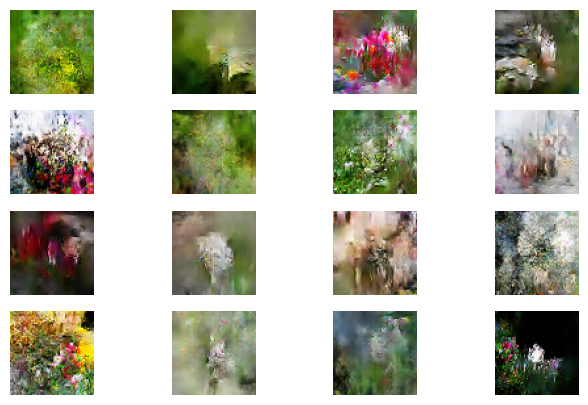

In [47]:
plt.figure(figsize=(8, 5))
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    plt.imshow(generated_images1[i].numpy().astype("uint8"))
    plt.axis('off')

plt.show()

Using the trained Generated to creat new images¶
Now we can use the trained Generator to creat new images.
Let's show some images generated from the trained Generator.

### In order to have better images you can train the GAN_model with more epochs.